In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage.io
import skimage.color
import skimage.filters
from scipy import signal
import random
from google.colab.patches import cv2_imshow

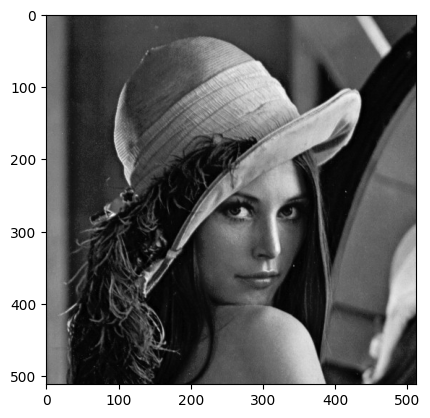

In [ ]:
img1 = cv2.imread("/content/person.tif")
img1 = np.array(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))
plt.imshow(img1, cmap='gray')
plt.show()

#Task 1: Linear Filter
You are required to implement the Smoothing Operation with Average Filter (Box & Weighted Average filters). Both filters can contain user defined parameters to obtain different levels of blurring effects, which is the size of the filter in this case. Complete the following two functions

In [ ]:
def convolution(image, kernel):

    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape

    output = np.zeros(image.shape)

    if kernel_h % 2 == 0 or kernel_w % 2 == 0:
        raise ValueError("Kernel dimensions should be odd.")

    pad_height = kernel_h // 2
    pad_width = kernel_w  // 2

    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    for i in range(image_h):
        for j in range(image_w):
            region = padded_image[i:i+kernel_h, j:j+kernel_w]

            output[i, j] = np.sum(region * kernel)

    return output

In [ ]:

def boxFilter(image, size):
    corrected_image = np.copy(image)
    pad_size = size // 2

    box_kernel = np.ones((size, size), dtype=np.float32) / (size * size)

    for channel in range(3):
        padded_image = np.pad(image[:, :, channel], ((pad_size, pad_size), (pad_size, pad_size)), mode='constant')
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                region = padded_image[i:i+size, j:j+size]
                corrected_image[i, j, channel] = np.sum(region * box_kernel)

    return corrected_image

In [ ]:
def weightedFilter(image, size):
    corrected_image = np.copy(image)
    pad_size = size // 2

    gaussian_kernel = cv2.getGaussianKernel(size, sigma=-1)
    weighted_kernel = gaussian_kernel @ gaussian_kernel.T

    for channel in range(3):
        padded_image = np.pad(image[:, :, channel], ((pad_size, pad_size), (pad_size, pad_size)), mode='constant')
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                region = padded_image[i:i+size, j:j+size]
                corrected_image[i, j, channel] = np.sum(region * weighted_kernel)

    return corrected_image

In [ ]:
def box_filter_hsv(image, size):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    v_channel = hsv_image[:, :, 2]

    v_filtered = cv2.boxFilter(v_channel, ddepth=-1, ksize=(size, size))

    hsv_image[:, :, 2] = v_filtered
    filtered_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)

    return filtered_image

def weighted_filter_hsv(image, size):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_channel = hsv_image[:, :, 2]

    kernel = np.ones((size, size), dtype=np.float32)
    kernel /= (size * size)

    v_filtered = cv2.filter2D(v_channel, -1, kernel)

    hsv_image[:, :, 2] = v_filtered

    filtered_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)

    return filtered_image

# Task 1: Output and Analysis
For this task, use an appropriate color image from Chapter 06.zip. Use your previously implemented functions to show the outputs of the two averaging filters on the sample image in both RGB and HSV color spaces. Provide your analysis on the following topics:
<ol>
<li> Explain how the parameters affect the increase or decrease of the blurring effect. </li>

<li> Do we require intensity scaling after applying averaging filters? </li>

<li> Is there any differences observed between the results of RGB and HSV color spaces? </li>
</ol>

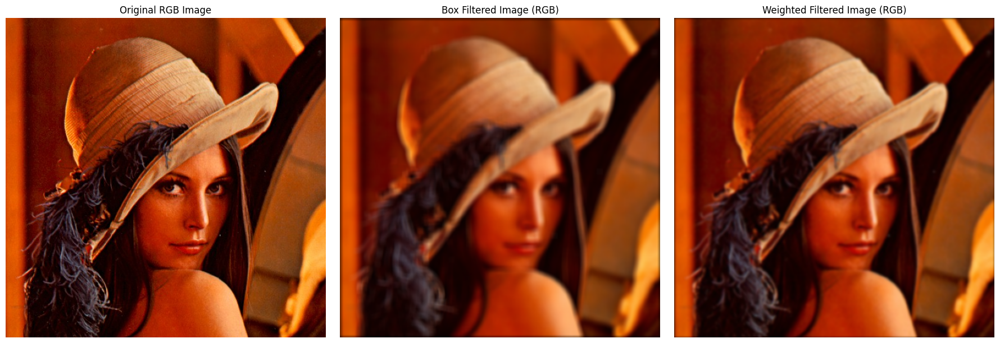

In [ ]:
# For RGB
img_rgb = cv2.imread('/content/person.tif')
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)


box_filtered_img_rgb = boxFilter(img_rgb, 10)
weighted_filtered_img_rgb = weightedFilter(img_rgb, 10)

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(img_rgb)
axs[0].set_title('Original RGB Image')
axs[0].axis('off')

axs[1].imshow(box_filtered_img_rgb)
axs[1].set_title('Box Filtered Image (RGB)')
axs[1].axis('off')

axs[2].imshow(weighted_filtered_img_rgb)
axs[2].set_title('Weighted Filtered Image (RGB)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

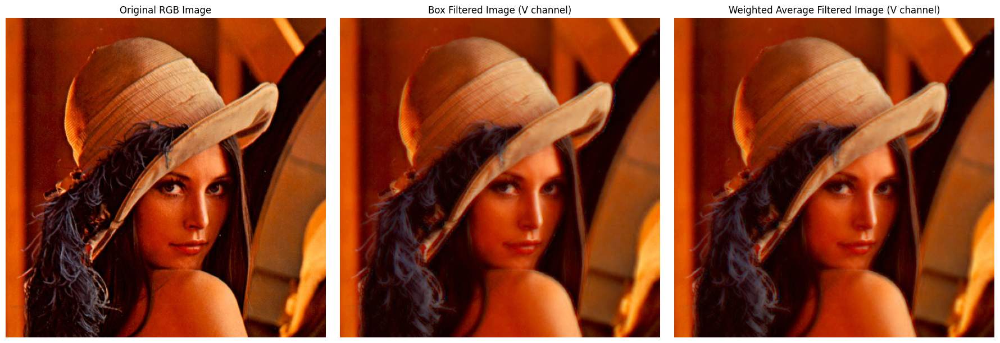

In [ ]:
# HSV on V channel
img_rgb = cv2.imread('/content/person.tif')
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)

box_filtered_image = box_filter_hsv(img_rgb, size=10)

weighted_filtered_image = weighted_filter_hsv(img_rgb, size=10)

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(img_rgb)
axs[0].set_title('Original RGB Image')
axs[0].axis('off')

axs[1].imshow(box_filtered_image)
axs[1].set_title('Box Filtered Image (V channel)')
axs[1].axis('off')

axs[2].imshow(weighted_filtered_image)
axs[2].set_title('Weighted Average Filtered Image (V channel)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

##Analysis:
[Write your analysis here]

# Task 2
For this task, you are required to write a function designed to artificially add Salt & Pepper noise to a given image. The function should contain a parameter called noise_level (value between 0 and 1) that determines the percentage of pixels that will be affected by Salt & Pepper noise.

Also, write three separate functions to implement the Median Filter, Min Filter, and Max Filter.

In [ ]:
def salt_and_pepper(image, probability):
    output = np.copy(image)
    for channel in range(3):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                rand = random.random()
                if rand < probability:
                    output[i, j, channel] = 0
                elif rand > 1 - probability:
                    output[i, j, channel] = 255
    return output


In [ ]:
def medianFilter(noisy_image, size):
    corrected_image = np.copy(noisy_image)
    pad_size = size // 2

    for channel in range(3):
        padded_image = np.pad(noisy_image[:, :, channel], ((pad_size, pad_size), (pad_size, pad_size)),
                              mode='constant', constant_values=0)
        for i in range(noisy_image.shape[0]):
            for j in range(noisy_image.shape[1]):
                region = padded_image[i:i+size, j:j+size]
                corrected_image[i, j, channel] = np.median(region)

    return corrected_image

In [ ]:
def minFilter(noisy_image, size):
    corrected_image = np.copy(noisy_image)
    pad_size = size // 2

    for channel in range(3):
        padded_image = np.pad(noisy_image[:, :, channel], ((pad_size, pad_size), (pad_size, pad_size)),
                              mode='constant', constant_values=255)
        for i in range(noisy_image.shape[0]):
            for j in range(noisy_image.shape[1]):
                region = padded_image[i:i+size, j:j+size]
                corrected_image[i, j, channel] = np.min(region)

    return corrected_image

In [ ]:
def maxFilter(noisy_image, size):
    corrected_image = np.copy(noisy_image)
    pad_size = size // 2

    for channel in range(3):
        padded_image = np.pad(noisy_image[:, :, channel], ((pad_size, pad_size), (pad_size, pad_size)),
                              mode='constant', constant_values=0)
        for i in range(noisy_image.shape[0]):
            for j in range(noisy_image.shape[1]):
                region = padded_image[i:i+size, j:j+size]
                corrected_image[i, j, channel] = np.max(region)

    return corrected_image

# Task 2: Output and Analysis
Use your previously implemented functions to show the addition of salt & pepper noise to a sample image, as well as how your implemented filters can remove the noise.

Show the results for both RGB and HSV color spaces.

Provide your analysis on the following topic:
<ol>
<li> What happens when the noise level increases for a particular filter size? </li>

<li> How does filter size affect the noise reduction? </li>

<li> Is there any differences observed between the results of RGB and HSV color spaces? </li>
</ol>

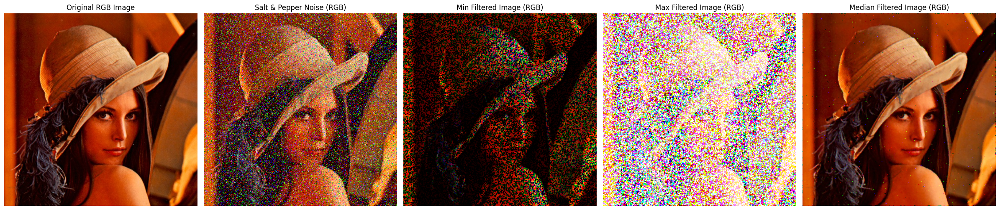

In [ ]:
img_rgb = cv2.imread('/content/person.tif')
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)

noisy_img_rgb = salt_and_pepper(img_rgb, 0.1)

min_filtered_img_rgb = minFilter(noisy_img_rgb, 3)
max_filtered_img_rgb = maxFilter(noisy_img_rgb, 3)
median_filtered_img_rgb = medianFilter(noisy_img_rgb, 3)

fig, axs = plt.subplots(1, 5, figsize=(24, 6))


axs[0].imshow(img_rgb)
axs[0].set_title('Original RGB Image')
axs[0].axis('off')

axs[1].imshow(noisy_img_rgb)
axs[1].set_title('Salt & Pepper Noise (RGB)')
axs[1].axis('off')

axs[2].imshow(min_filtered_img_rgb)
axs[2].set_title('Min Filtered Image (RGB)')
axs[2].axis('off')

axs[3].imshow(max_filtered_img_rgb)
axs[3].set_title('Max Filtered Image (RGB)')
axs[3].axis('off')

axs[4].imshow(median_filtered_img_rgb)
axs[4].set_title('Median Filtered Image (RGB)')
axs[4].axis('off')

plt.tight_layout()
plt.show()

## Analysis:
[Write your analysis here]

# Task 3

For this task, you are required to design a Laplacian filter that will be used to compute edge responses. The function will return the edge response as an image, which will be called inside the sharpen function to generate a sharpened version of an image. The sharpen function contains a user defined parameter that can be used to control the level of sharpening.


In [ ]:
def laplacian(image):
    laplacian_kernel = np.array([[0, -1, 0],
                                 [-1, 4, -1],
                                 [0, -1, 0]], dtype=np.float32)

    edge_response = np.zeros_like(image)

    for channel in range(3):
        edge_response[:, :, channel] = cv2.filter2D(image[:, :, channel], -1, laplacian_kernel)

    return edge_response

def sharpen(image, sharpen_level=1.0):
    edge_response = laplacian(image)

    sharp_image = np.clip(image + sharpen_level * edge_response, 0, 255).astype(np.uint8)

    return sharp_image

# Task 3: Output and Analysis
Use your previously implemented laplacian function to show the edge response of a sample image. use an appropriate color image from Chapter 06.zip for this task. Next, show the sharpened image after using the sharpen function.

Show the results for both RGB and HSV color spaces.

Provide your analysis on the following topic:
<ol>
<li> Why do we require intensity scaling after computing the sharpening? </li>
<li> How does the value of sharpen_level affect the sharpening? </li>
<li> Is there any differences observed between the results of RGB and HSV color spaces? </li>

</ol>

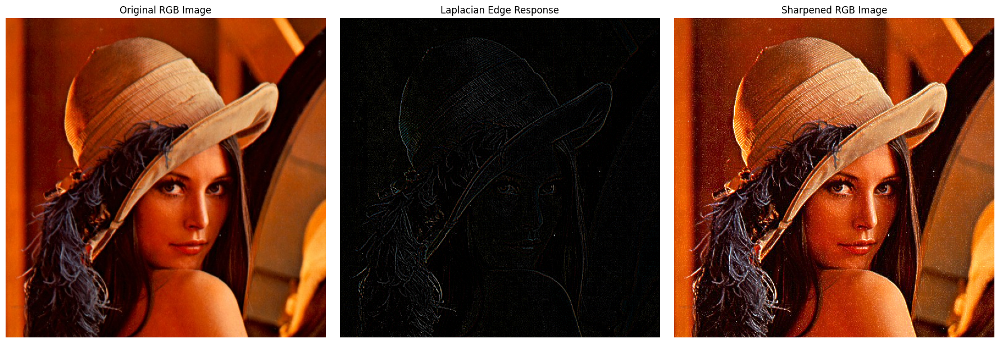

In [ ]:
img_rgb = cv2.imread('/content/person.tif')
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)

edge_response_rgb = laplacian(img_rgb)

sharpened_img_rgb = sharpen(img_rgb, sharpen_level=1.5)

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(img_rgb)
axs[0].set_title('Original RGB Image')
axs[0].axis('off')

axs[1].imshow(edge_response_rgb)
axs[1].set_title('Laplacian Edge Response')
axs[1].axis('off')

axs[2].imshow(sharpened_img_rgb)
axs[2].set_title('Sharpened RGB Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

## Analysis:
[Write your analysis here]

# Task 4

For this task, you are required to design a function that takes two parameters: an image and a value $k$. The function should perform Unsharp masking ($k=1$) and High-boost filtering ($k>1$) and return a filtered image.

In [ ]:
def high_boost_filter(image, k):
    gaussian_kernel_size = 5
    blurred_image = cv2.GaussianBlur(image, (gaussian_kernel_size, gaussian_kernel_size), 0)

    edge_response = cv2.addWeighted(image, 1.0, blurred_image, -1.0, 0)

    if k == 1:
        filtered_image = cv2.add(image, edge_response)
    else:
        filtered_image = cv2.add(image, k * edge_response)

    filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

    return filtered_image

# Task 4: Output and Analysis
Use your previously implemented high_boost_filter function to show the output of Unsharp Masking and High-boost filtering on an RGB image. Next, show both outputs for the HSI color space.

Provide your analysis on the following topic:
<ol>
<li> Is there any difference in applying unsharp masking or high-boost filtering for RGB and HSI color space? </li>
<li> What happens if $k<1$? </li>
</ol>

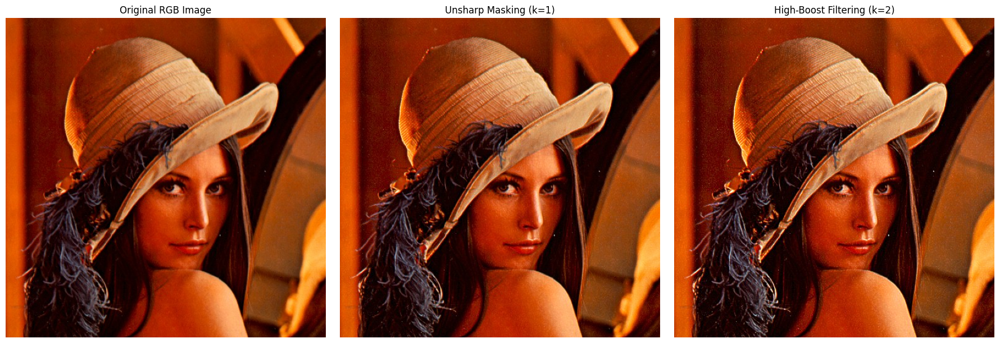

In [ ]:
img_rgb = cv2.imread('/content/person.tif')
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)

unsharp_image = high_boost_filter(img_rgb, k=1)

high_boost_image = high_boost_filter(img_rgb, k=2)

import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(img_rgb)
axs[0].set_title('Original RGB Image')
axs[0].axis('off')

axs[1].imshow(unsharp_image)
axs[1].set_title('Unsharp Masking (k=1)')
axs[1].axis('off')

axs[2].imshow(high_boost_image)
axs[2].set_title('High-Boost Filtering (k=2)')
axs[2].axis('off')

plt.tight_layout()
plt.show()